# Dependencies

In [6]:
!git clone https://github.com/voxelmorph/voxelmorph.git # getting vxm from git to use scripts
!pip install neurite

Cloning into 'voxelmorph'...
remote: Enumerating objects: 3228, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 3228 (delta 8), reused 15 (delta 6), pack-reused 3202
Receiving objects: 100% (3228/3228), 129.18 MiB | 35.42 MiB/s, done.
Resolving deltas: 100% (2073/2073), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pystrum: filename=pystrum-0.3-py3-none-any.whl size=19530 sha256=453f003e764e4ca361781dc53e0993d53e15e80baf313739866bf4561e34f338
  Stored in directory: /root/.cache/pip/wheels/33/42/e2/6312e2cd3efadacc2714759efc7c7dc1513db7853e8bd508f6
Successfully built pystrum


In [7]:
!pip install nibabel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Imports

In [8]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import neurite as ne
import sys 
sys.path.append('voxelmorph')
import voxelmorph as vxm
import time

import os
import random
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.ndimage import rotate

assert tf.__version__.startswith('2.'), 'This tutorial assumes Tensorflow 2.0+'

np.random.seed(777)
tf.random.set_seed(777)

# disable eager execution
# tf.compat.v1.disable_eager_execution()
# tf.compat.v1.experimental.output_all_intermediates(True) # https://github.com/tensorflow/tensorflow/issues/54458

# Connect to driver

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Download dataset OASIS

In [3]:
# get neurite-OASIS data
!wget https://surfer.nmr.mgh.harvard.edu/ftp/data/neurite/data/neurite-oasis.2d.v1.0.tar
!mkdir OASIS
!tar xf neurite-oasis.2d.v1.0.tar --directory 'OASIS'

# !wget https://surfer.nmr.mgh.harvard.edu/ftp/data/neurite/data/neurite-oasis.v1.0.tar
# !mkdir OASIS
# !tar xf neurite-oasis.v1.0.tar --directory 'OASIS'

--2023-05-13 00:01:50--  https://surfer.nmr.mgh.harvard.edu/ftp/data/neurite/data/neurite-oasis.2d.v1.0.tar
Resolving surfer.nmr.mgh.harvard.edu (surfer.nmr.mgh.harvard.edu)... 132.183.1.43
Connecting to surfer.nmr.mgh.harvard.edu (surfer.nmr.mgh.harvard.edu)|132.183.1.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24903680 (24M) [application/x-tar]
Saving to: ‘neurite-oasis.2d.v1.0.tar’

neurite-oasis.2d.v1 100%[===================>]  23.75M  56.8MB/s    in 0.4s    

2023-05-13 00:01:51 (56.8 MB/s) - ‘neurite-oasis.2d.v1.0.tar’ saved [24903680/24903680]



In [4]:
# write a list of OASIS subjects to a training file
import pathlib
path = pathlib.Path('/content/OASIS')
subj_lst_m = [str(f/'slice_norm.nii.gz') for f in path.iterdir() if str(f).endswith('MR1')]

train = subj_lst_m[:int(0.9 * len(subj_lst_m))]
validate = subj_lst_m[int(0.9 * len(subj_lst_m)):]

with open('train_list.txt','w') as tfile:
	tfile.write('\n'.join(train))

# Train

In [6]:
# training parameters
class TrainArgs:
  img_list: str = 'train_list.txt'
  img_prefix: str = None
  img_suffix: str = None
  atlas: str = None
  model_dir: str = 'models'
  multichannel: bool = False
  gpu: int = 0
  batch_size: int = 1
  epochs: int = 1500
  steps_per_epoch: int = 100
  load_weights: str = None
  initial_epoch: int = 0
  lr: float = 1e-4
  enc: list = None
  dec: list = None
  int_steps: int = 7
  int_downsize: int = 2
  use_probs: bool = False
  bidir: bool = False
  image_loss: str = 'mse'
  lambda_weight: float = 0.01
  kl_lambda: float = 10
  image_sigma: float = 1.0

train_args = TrainArgs()
train_args.epochs = 5000

# load and prepare training data
train_files = vxm.py.utils.read_file_list(train_args.img_list, prefix=train_args.img_prefix,
                                          suffix=train_args.img_suffix)
assert len(train_files) > 0, 'Could not find any training data.'

# no need to append an extra feature axis if data is multichannel
add_feat_axis = not train_args.multichannel

if train_args.atlas:
    # scan-to-atlas generator
    atlas = vxm.py.utils.load_volfile(train_args.atlas, np_var='vol',
                                      add_batch_axis=True, add_feat_axis=add_feat_axis)
    generator = vxm.generators.scan_to_atlas(train_files, atlas,
                                             batch_size=train_args.batch_size,
                                             bidir=train_args.bidir,
                                             add_feat_axis=add_feat_axis)
else:
    # scan-to-scan generator
    generator = vxm.generators.scan_to_scan(
        train_files, batch_size=train_args.batch_size, bidir=train_args.bidir, add_feat_axis=add_feat_axis)

# extract shape and number of features from sampled input
sample_shape = next(generator)[0][0].shape
inshape = sample_shape[1:-1]
nfeats = sample_shape[-1]

# prepare model folder
model_dir = train_args.model_dir
os.makedirs(model_dir, exist_ok=True)

# tensorflow device handling
device, nb_devices = vxm.tf.utils.setup_device(train_args.gpu)
assert np.mod(train_args.batch_size, nb_devices) == 0, \
    'Batch size (%d) should be a multiple of the nr of gpus (%d)' % (train_args.batch_size, nb_devices)

# unet architecture
enc_nf = train_args.enc if train_args.enc else [16, 32, 32, 32]
dec_nf = train_args.dec if train_args.dec else [32, 32, 32, 32, 32, 16, 16]

# prepare model checkpoint save path
save_filename = os.path.join(model_dir, '{epoch:04d}.h5')

# build the model
model = vxm.networks.VxmDense(
    inshape=inshape,
    nb_unet_features=[enc_nf, dec_nf],
    bidir=train_args.bidir,
    use_probs=train_args.use_probs,
    int_steps=train_args.int_steps,
    int_resolution=train_args.int_downsize,
    src_feats=nfeats,
    trg_feats=nfeats
)

# load initial weights (if provided)
if train_args.load_weights:
    model.load_weights(train_args.load_weights)

# prepare image loss
if train_args.image_loss == 'ncc':
    image_loss_func = vxm.losses.NCC().loss
elif train_args.image_loss == 'mse':
    image_loss_func = vxm.losses.MSE(train_args.image_sigma).loss
else:
    raise ValueError('Image loss should be "mse" or "ncc", but found "%s"' % train_args.image_loss)

# need two image loss functions if bidirectional
if train_args.bidir:
    losses = [image_loss_func, image_loss_func]
    weights = [0.5, 0.5]
else:
    losses = [image_loss_func]
    weights = [1]

# prepare deformation loss
if train_args.use_probs:
    flow_shape = model.outputs[-1].shape[1:-1]
    losses += [vxm.losses.KL(train_args.kl_lambda, flow_shape).loss]
else:
    losses += [vxm.losses.Grad('l2', loss_mult=train_args.int_downsize).loss]

weights += [train_args.lambda_weight]

# multi-gpu support
if nb_devices > 1:
    save_callback = vxm.networks.ModelCheckpointParallel(save_filename)
    model = tf.keras.utils.multi_gpu_model(model, gpus=nb_devices)
else:
    save_callback = tf.keras.callbacks.ModelCheckpoint(save_filename, 
                                                       save_freq=20 * train_args.steps_per_epoch)

model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=train_args.lr), loss=losses, loss_weights=weights)

# save starting weights
# model.save(save_filename.format(epoch=train_args.initial_epoch))

In [7]:
model.summary()

Model: "vxm_dense"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 vxm_dense_source_input (InputL  [(None, 160, 192, 1  0          []                               
 ayer)                          )]                                                                
                                                                                                  
 vxm_dense_target_input (InputL  [(None, 160, 192, 1  0          []                               
 ayer)                          )]                                                                
                                                                                                  
 vxm_dense_unet_input_concat (C  (None, 160, 192, 2)  0          ['vxm_dense_source_input[0][0]', 
 oncatenate)                                                      'vxm_dense_target_input[

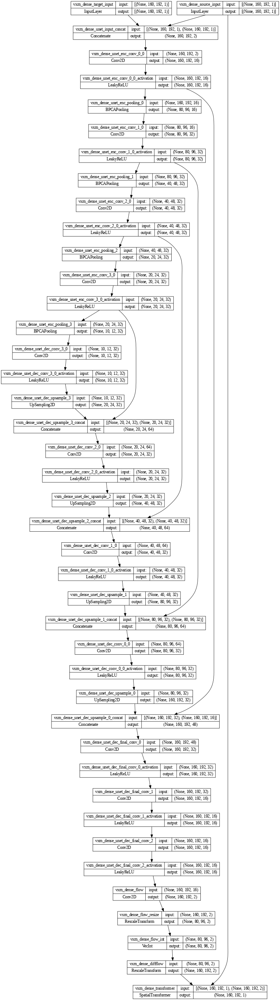

In [8]:
tf.keras.utils.plot_model(model, expand_nested=True, dpi=60, show_shapes=True)

Streaming output truncated to the last 5000 lines.
100/100 [==============================] - 6s 64ms/step - loss: 0.0027 - vxm_dense_transformer_loss: 0.0018 - vxm_dense_flow_resize_loss: 0.0836
Epoch 2502/5000
100/100 [==============================] - 6s 59ms/step - loss: 0.0028 - vxm_dense_transformer_loss: 0.0019 - vxm_dense_flow_resize_loss: 0.0880
Epoch 2503/5000
100/100 [==============================] - 6s 64ms/step - loss: 0.0026 - vxm_dense_transformer_loss: 0.0018 - vxm_dense_flow_resize_loss: 0.0840
Epoch 2504/5000
100/100 [==============================] - 6s 60ms/step - loss: 0.0026 - vxm_dense_transformer_loss: 0.0017 - vxm_dense_flow_resize_loss: 0.0826
Epoch 2505/5000
100/100 [==============================] - 6s 63ms/step - loss: 0.0026 - vxm_dense_transformer_loss: 0.0018 - vxm_dense_flow_resize_loss: 0.0816
Epoch 2506/5000
100/100 [==============================] - 6s 60ms/step - loss: 0.0027 - vxm_dense_transformer_loss: 0.0018 - vxm_dense_flow_resize_loss: 0.0852

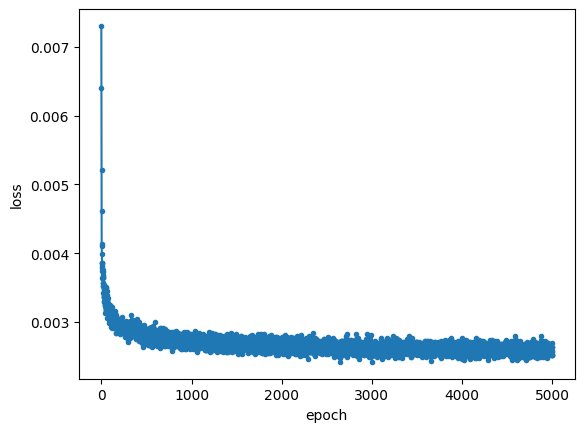

In [9]:
hist = model.fit(generator,
         initial_epoch=train_args.initial_epoch,
         epochs=train_args.epochs,
         steps_per_epoch=train_args.steps_per_epoch,
         callbacks=[save_callback],
         verbose=1
        )

# saving the model in tensorflow format
model.save(f'./{train_args.epochs}_tf',save_format='tf')
model.save(save_filename.format(epoch=train_args.epochs))

# plot training history.
plt.figure()
plt.plot(hist.epoch, hist.history['loss'], '.-')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

In [10]:
min(hist.history['loss'])

0.0024170642718672752

In [11]:
!zip -r 5000-epoch-models.zip /content/models/
!zip -r 5000-tf.zip /content/5000_tf/

  adding: content/models/ (stored 0%)
  adding: content/models/2800.h5 (deflated 15%)
  adding: content/models/0520.h5 (deflated 15%)
  adding: content/models/0160.h5 (deflated 15%)
  adding: content/models/0800.h5 (deflated 15%)
  adding: content/models/0860.h5 (deflated 15%)
  adding: content/models/2960.h5 (deflated 15%)
  adding: content/models/1320.h5 (deflated 15%)
  adding: content/models/4600.h5 (deflated 15%)
  adding: content/models/3260.h5 (deflated 15%)
  adding: content/models/4880.h5 (deflated 15%)
  adding: content/models/2500.h5 (deflated 15%)
  adding: content/models/2320.h5 (deflated 15%)
  adding: content/models/1820.h5 (deflated 15%)
  adding: content/models/1480.h5 (deflated 15%)
  adding: content/models/3060.h5 (deflated 15%)
  adding: content/models/0120.h5 (deflated 15%)
  adding: content/models/1340.h5 (deflated 15%)
  adding: content/models/0600.h5 (deflated 15%)
  adding: content/models/3880.h5 (deflated 15%)
  adding: content/models/2200.h5 (deflated 15%)
  

In [12]:
!cp 5000-epoch-models.zip "/content/gdrive/MyDrive/Colab Notebooks/Master's degree/Image registration with BPCA/"
!cp 5000-tf.zip "/content/gdrive/MyDrive/Colab Notebooks/Master's degree/Image registration with BPCA/"

# Layers output

In [13]:
def get_plotting_matrix_shape(num):
    """
    Given a number, returns the number of columns and the number of rows needed for a plotting matrix.
    """
    sqrt = int(num ** 0.5)
    if sqrt ** 2 == num:
        return sqrt, sqrt
    else:
        for i in range(sqrt, 0, -1):
            if num % i == 0:
                return num // i, i

In [14]:
def visualize_output_layer(model, layer_name):
  layer_output=model.get_layer(layer_name).output

  # load moving and fixed images
  fixed = vxm.py.utils.load_volfile(train[55], add_batch_axis=True, add_feat_axis=True)
  moving = vxm.py.utils.load_volfile(train[0], add_batch_axis=True, add_feat_axis=True)

  intermediate_model=tf.keras.models.Model(
      inputs=model.input,
      outputs=layer_output
  )

  with tf.device(device):
    intermediate_prediction=intermediate_model.predict(
        [moving, fixed]
    )

  row_size, col_size = get_plotting_matrix_shape(np.shape(intermediate_prediction)[-1])

  img_index=0
  print(np.shape(intermediate_prediction))

  fig,ax=plt.subplots(row_size,col_size,figsize=(10,8))
  for row in range(0,row_size):
    for col in range(0,col_size):
      ax[row][col].tick_params(left = False, right = False, labelleft = False, labelbottom = False, bottom = False)
      ax[row][col].imshow(intermediate_prediction[0, :, :, img_index], cmap='gray')
      img_index+=1


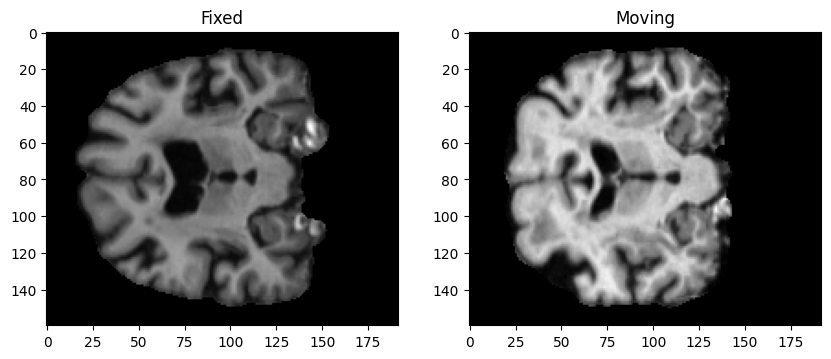

In [17]:
# Load the two images
fixed = vxm.py.utils.load_volfile(train[55], add_batch_axis=True, add_feat_axis=True)
moving = vxm.py.utils.load_volfile(train[0], add_batch_axis=True, add_feat_axis=True)

# Create a figure with two subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 8))

# Plot the fixed image on the left subplot
axs[0].imshow(fixed.reshape(160,192), cmap='gray')
axs[0].set_title('Fixed')

# Plot the moving image on the right subplot
axs[1].imshow(moving.reshape(160,192), cmap='gray')
axs[1].set_title('Moving')

# Display the figure
plt.show()

1/1 [==============================] - 0s 460ms/step
(1, 80, 96, 16)


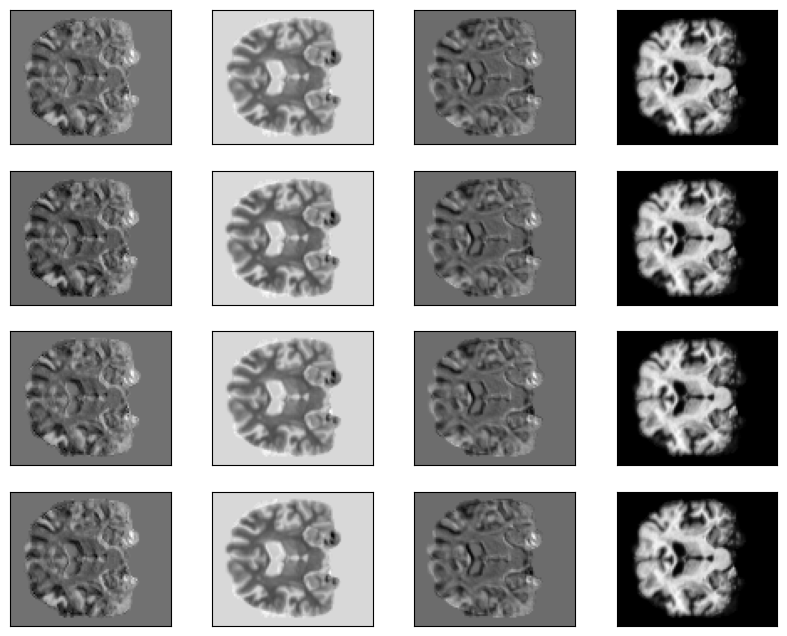

In [18]:
visualize_output_layer(
    model,
    'vxm_dense_unet_enc_pooling_0',
)

# Registration (Plot)

## Normalized (Fixed) with Original (Moving)

1/1 [==============================] - 0s 233ms/step


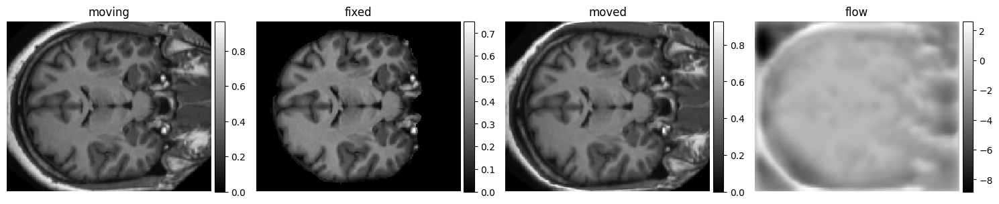

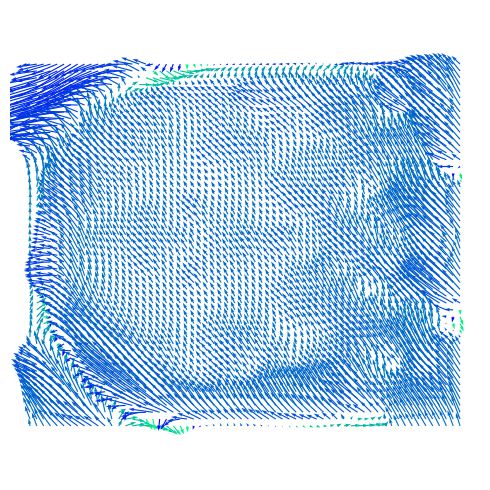



1/1 [==============================] - 0s 216ms/step


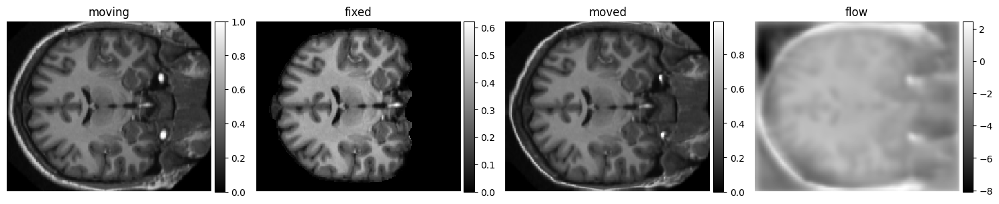

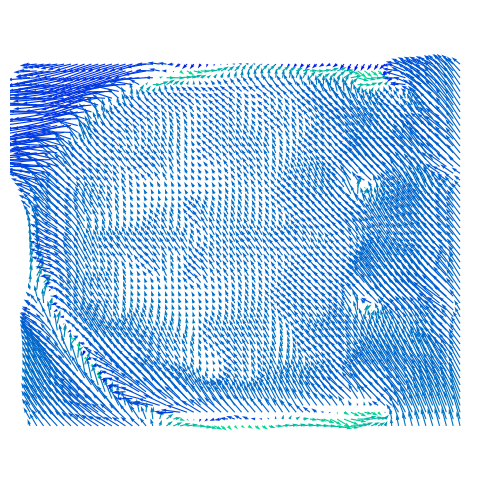

1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 0s 233ms/step


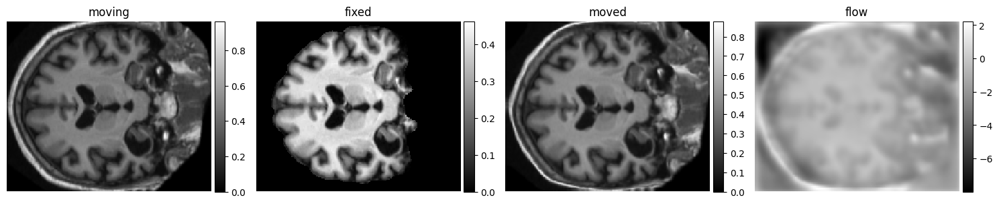

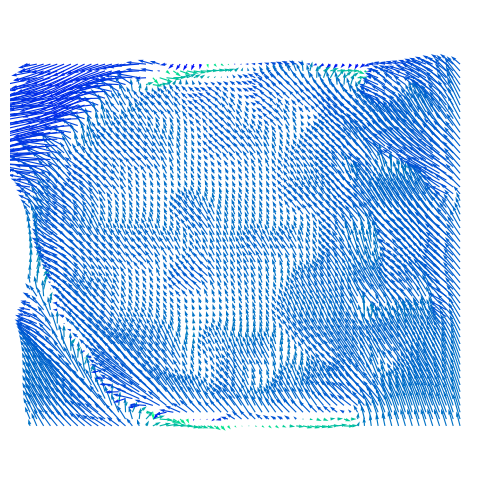



1/1 [==============================] - 0s 226ms/step


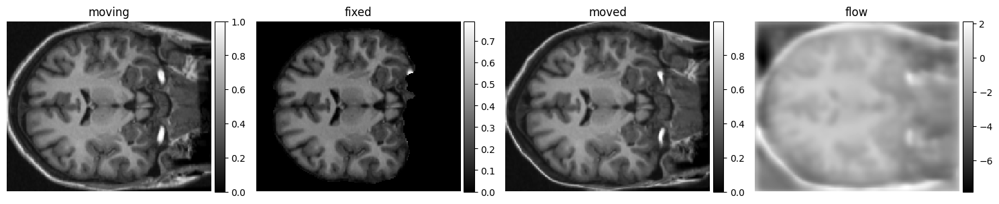

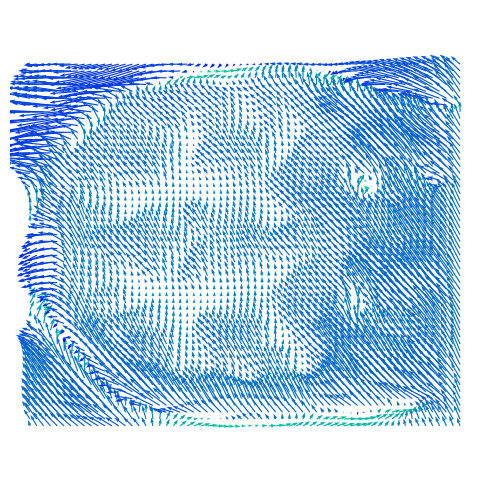



1/1 [==============================] - 0s 219ms/step


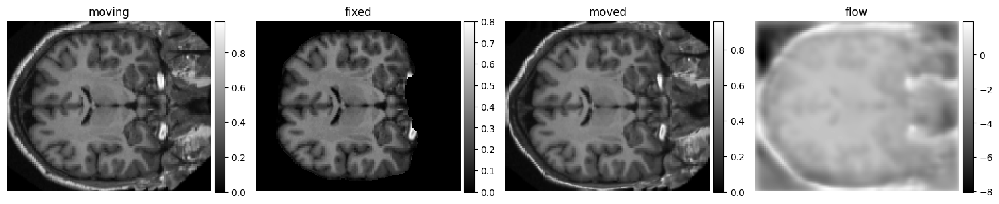

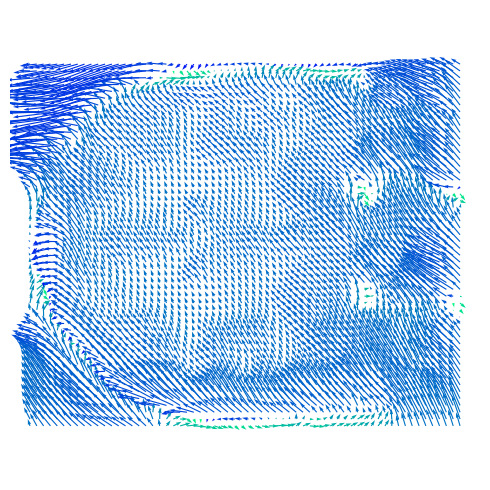

In [10]:
class RegistrationArgs:
  moving: str = None
  fixed: str = None
  moved: str = None
  model: str = None
  warp: str = None
  gpu: int = None
  multichannel: bool = False

for f in validate[:5]:
  registration_1_args = RegistrationArgs()
  registration_1_args.fixed = f
  registration_1_args.moving = f.replace('slice_norm', 'slice_orig')
  registration_1_args.moved = 'moved.nii.gz'
  registration_1_args.warp = 'warp.nii.gz'
  registration_1_args.model = '/content/models/5000.h5'
  registration_1_args.gpu = 0
  
  # tensorflow device handling
  device, nb_devices = vxm.tf.utils.setup_device(registration_1_args.gpu)

  # load moving and fixed images
  add_feat_axis = not registration_1_args.multichannel
  moving = vxm.py.utils.load_volfile(registration_1_args.moving, add_batch_axis=True, add_feat_axis=add_feat_axis)

  fixed, fixed_affine = vxm.py.utils.load_volfile(
      registration_1_args.fixed, add_batch_axis=True, add_feat_axis=add_feat_axis, ret_affine=True)

  inshape = moving.shape[1:-1]
  nb_feats = moving.shape[-1]

  with tf.device(device):
      # load model and predict
      config = dict(inshape=inshape, input_model=None)
      
      warp = vxm.networks.VxmDense.load(registration_1_args.model, **config).register(moving, fixed)
      moved = vxm.networks.Transform(inshape, nb_feats=nb_feats).predict([moving, warp])

  # save warp
  # if registration_1_args.warp:
  #     vxm.py.utils.save_volfile(warp.squeeze(), registration_1_args.warp, fixed_affine)


  # save moved image
  # vxm.py.utils.save_volfile(moved.squeeze(), registration_1_args.moved, fixed_affine)

  # visualize registration between a pair of moving and fixed
  images = [img[0, :, :, 0] for img in [moving, fixed, moved, warp]]
  titles = ['moving', 'fixed', 'moved', 'flow']
  ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

  print()

  # visualize flow
  flow = warp.squeeze()[::3,::3]
  ne.plot.flow([flow], width=5);

  print()
  print()

## Normalized (Fixed) with another Normalized (Fixed)

1/1 [==============================] - 0s 215ms/step


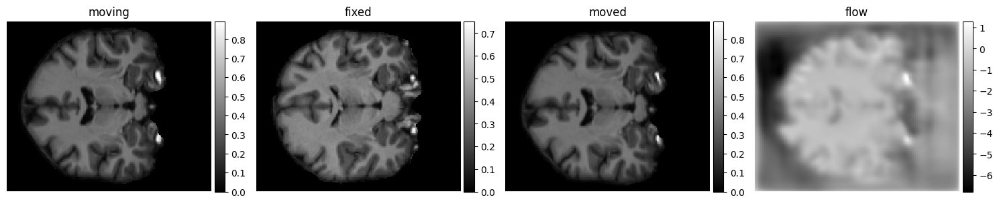

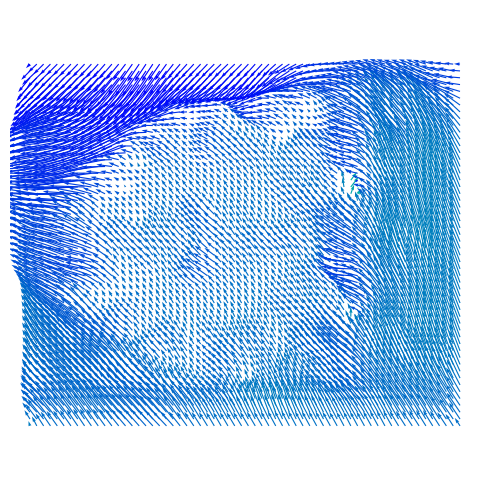



1/1 [==============================] - 0s 227ms/step


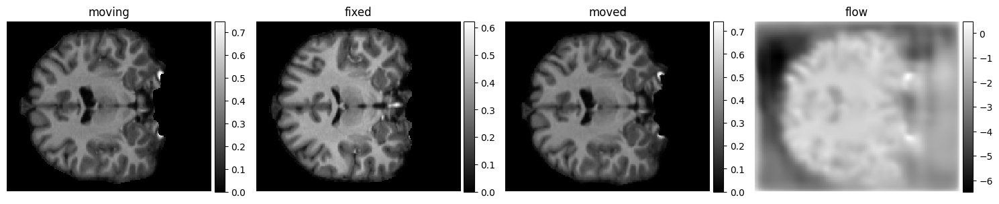

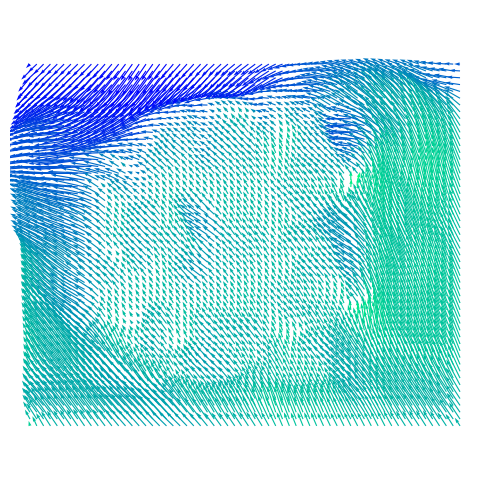



1/1 [==============================] - 0s 362ms/step


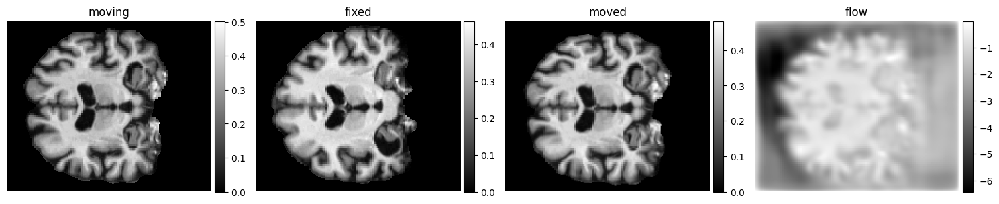

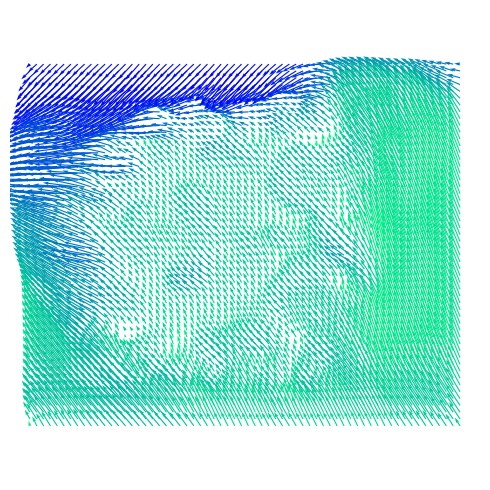



1/1 [==============================] - 0s 216ms/step


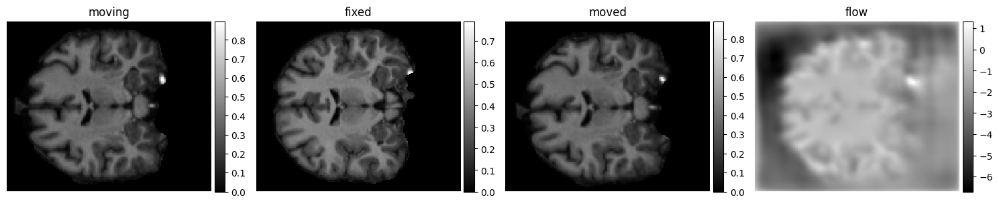

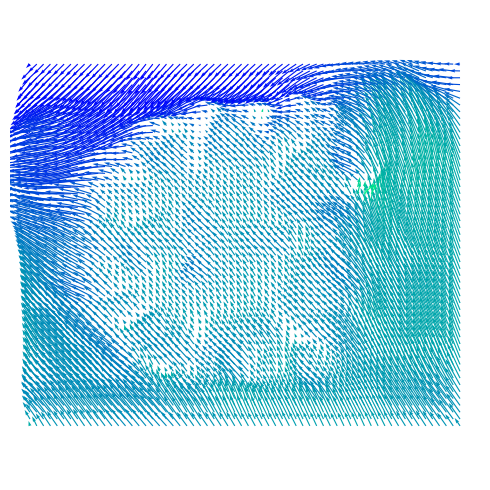



1/1 [==============================] - 0s 225ms/step


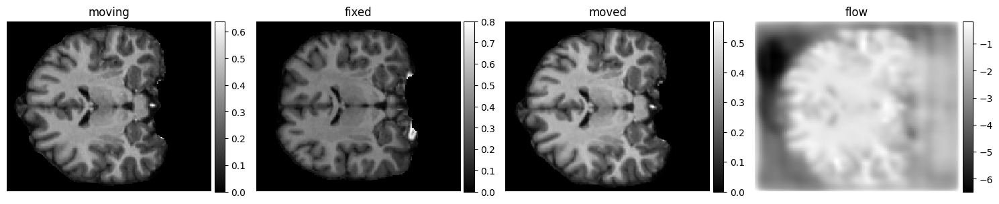

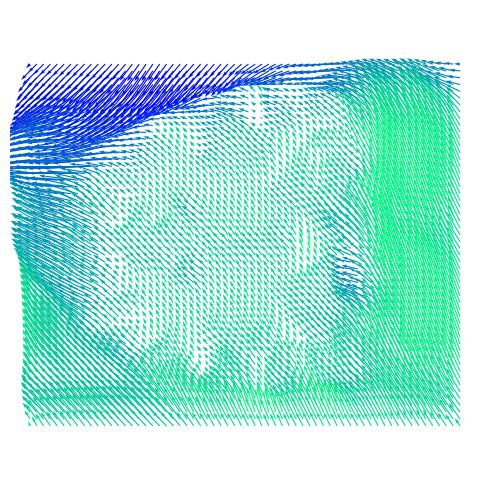

In [11]:
class RegistrationArgs:
  moving: str = None
  fixed: str = None
  moved: str = None
  model: str = None
  warp: str = None
  gpu: int = None
  multichannel: bool = False

i = 5
for f in validate[:5]:
  registration_2_args = RegistrationArgs()
  registration_2_args.fixed = f
  registration_2_args.moving = f.replace('slice_norm', 'slice_orig')
  registration_2_args.moved = 'moved.nii.gz'
  registration_2_args.warp = 'warp.nii.gz'
  registration_2_args.model = '/content/models/5000.h5'
  registration_2_args.gpu = 0
  
  # tensorflow device handling
  device, nb_devices = vxm.tf.utils.setup_device(registration_2_args.gpu)

  # load moving and fixed images
  add_feat_axis = not registration_2_args.multichannel
  moving = vxm.py.utils.load_volfile(validate[i], add_batch_axis=True, add_feat_axis=add_feat_axis)
  
  fixed, fixed_affine = vxm.py.utils.load_volfile(
      registration_2_args.fixed, add_batch_axis=True, add_feat_axis=add_feat_axis, ret_affine=True)

  inshape = moving.shape[1:-1]
  nb_feats = moving.shape[-1]

  with tf.device(device):
      # load model and predict
      config = dict(inshape=inshape, input_model=None)
      
      warp = vxm.networks.VxmDense.load(registration_2_args.model, **config).register(moving, fixed)
      moved = vxm.networks.Transform(inshape, nb_feats=nb_feats).predict([moving, warp])

  # save warp
  # if registration_2_args.warp:
  #     vxm.py.utils.save_volfile(warp.squeeze(), registration_2_args.warp, fixed_affine)


  # save moved image
  # vxm.py.utils.save_volfile(moved.squeeze(), registration_2_args.moved, fixed_affine)

  # visualize registration between a pair of moving and fixed
  images = [img[0, :, :, 0] for img in [moving, fixed, moved, warp]]
  titles = ['moving', 'fixed', 'moved', 'flow']
  ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

  print()

  # visualize flow
  flow = warp.squeeze()[::3,::3]
  ne.plot.flow([flow], width=5);

  print()
  print()

  i = i + 1

## Normalized (Fixed) with rotate the Normalized (Fixed) by 45 degrees counter-clockwise

1/1 [==============================] - 0s 219ms/step


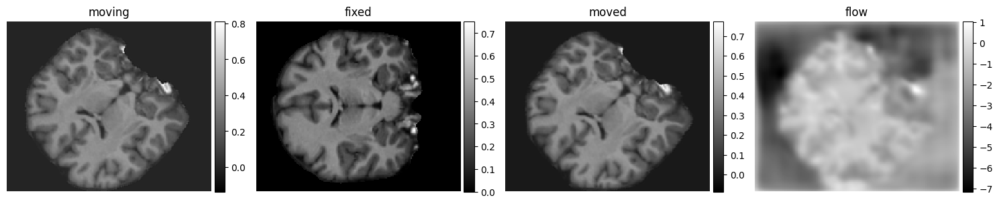

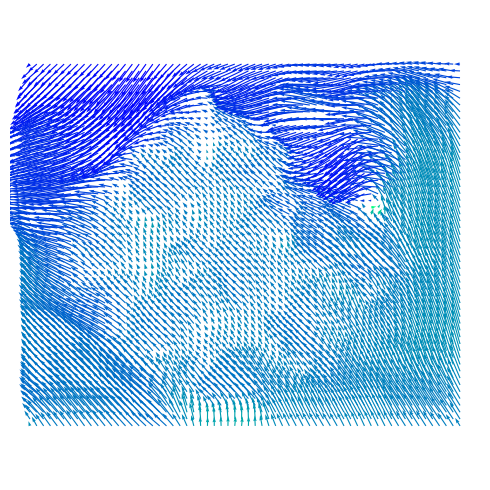



1/1 [==============================] - 0s 214ms/step


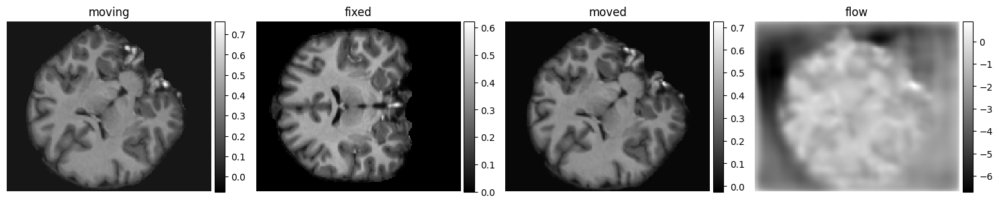

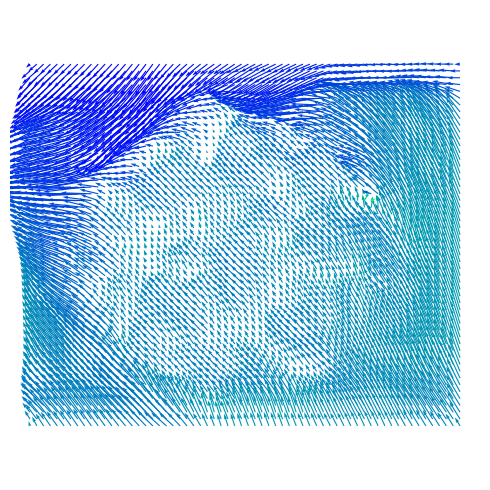



1/1 [==============================] - 0s 247ms/step


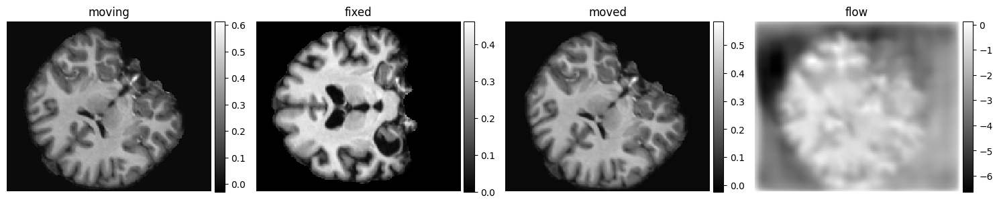

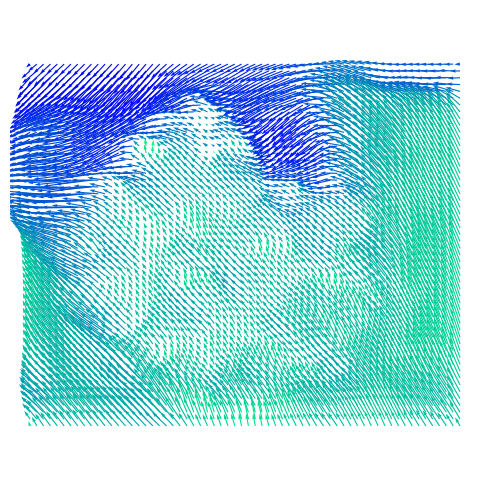



1/1 [==============================] - 0s 227ms/step


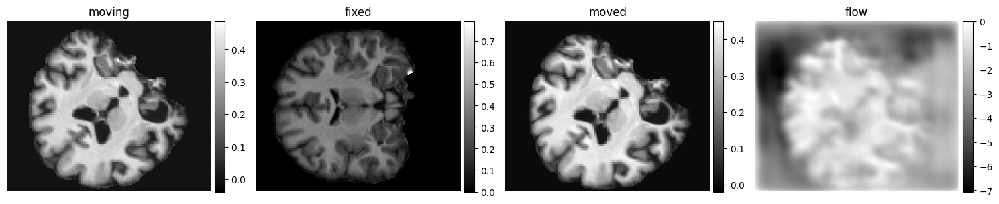

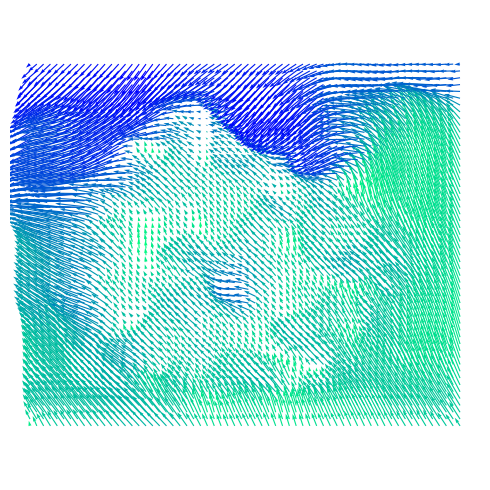



1/1 [==============================] - 0s 223ms/step


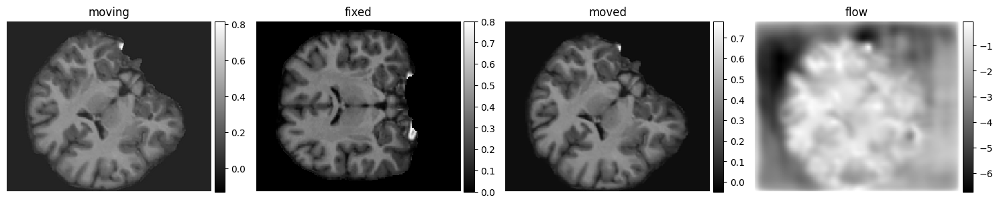

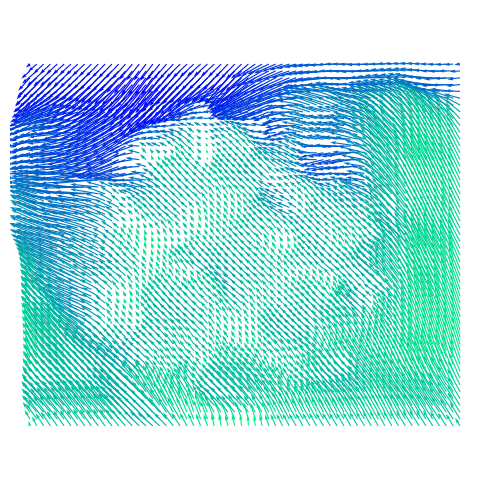

In [12]:
class RegistrationArgs:
  moving: str = None
  fixed: str = None
  moved: str = None
  model: str = None
  warp: str = None
  gpu: int = None
  multichannel: bool = False

for f in validate[:5]:
  registration_3_args = RegistrationArgs()
  registration_3_args.fixed = f
  registration_3_args.moving = f.replace('slice_norm', 'slice_orig')
  registration_3_args.moved = 'moved.nii.gz'
  registration_3_args.warp = 'warp.nii.gz'
  registration_3_args.model = '/content/models/5000.h5'
  registration_3_args.gpu = 0
  
  # tensorflow device handling
  device, nb_devices = vxm.tf.utils.setup_device(registration_3_args.gpu)

  # load moving and fixed images
  add_feat_axis = not registration_3_args.multichannel

  # rotate the image by 45 degrees counter-clockwise
  moving = vxm.py.utils.load_volfile(registration_3_args.fixed, add_batch_axis=True, add_feat_axis=add_feat_axis)
  moving = rotate(fixed, angle=45, axes=(1, 2), reshape=False)

  fixed, fixed_affine = vxm.py.utils.load_volfile(
      registration_3_args.fixed, add_batch_axis=True, add_feat_axis=add_feat_axis, ret_affine=True)

  inshape = moving.shape[1:-1]
  nb_feats = moving.shape[-1]

  with tf.device(device):
      # load model and predict
      config = dict(inshape=inshape, input_model=None)
      
      warp = vxm.networks.VxmDense.load(registration_3_args.model, **config).register(moving, fixed)
      moved = vxm.networks.Transform(inshape, nb_feats=nb_feats).predict([moving, warp])

  # save warp
  # if registration_3_args.warp:
  #     vxm.py.utils.save_volfile(warp.squeeze(), registration_3_args.warp, fixed_affine)


  # save moved image
  # vxm.py.utils.save_volfile(moved.squeeze(), registration_3_args.moved, fixed_affine)

  # visualize registration between a pair of moving and fixed
  images = [img[0, :, :, 0] for img in [moving, fixed, moved, warp]]
  titles = ['moving', 'fixed', 'moved', 'flow']
  ne.plot.slices(images, titles=titles, cmaps=['gray'], do_colorbars=True);

  print()

  # visualize flow
  flow = warp.squeeze()[::3,::3]
  ne.plot.flow([flow], width=5);

  print()
  print()

# Testing (measuring Dice scores)

## Normalized (Fixed) with Original (Moving)

In [13]:
# keep track of all dice scores
reg_times = []
dice_means = []

img_pairs = []
seg_pairs = []

class TestingArgs:
  model: str = None
  labels = None

testing_1_args = TestingArgs()
testing_1_args.model = '/content/models/5000.h5'

labels = np.load(testing_1_args.labels) if testing_1_args.labels else None

for f in validate[:44]:
  img_pairs.append([f, f.replace('slice_norm', 'slice_orig')])
  seg_pairs.append([f.replace('slice_norm', 'slice_seg24'), f.replace('slice_norm', 'slice_seg24')])

with tf.device(device):
    # load model and build nearest-neighbor transfer model
    model = vxm.networks.VxmDense.load(testing_1_args.model, input_model=None)
    registration_model = model.get_registration_model()
    inshape = registration_model.inputs[0].shape[1:-1]
    transform_model = vxm.networks.Transform(inshape, interp_method='nearest')

    for i in range(len(img_pairs)):

        # load moving image and seg
        moving_vol = vxm.py.utils.load_volfile(
            img_pairs[i][0], np_var='vol', add_batch_axis=True, add_feat_axis=add_feat_axis)
        moving_seg = vxm.py.utils.load_volfile(
            seg_pairs[i][0], np_var='seg', add_batch_axis=True, add_feat_axis=add_feat_axis)

        # load fixed image and seg
        fixed_vol = vxm.py.utils.load_volfile(
            img_pairs[i][1], np_var='vol', add_batch_axis=True, add_feat_axis=add_feat_axis)
        fixed_seg = vxm.py.utils.load_volfile(
            seg_pairs[i][1], np_var='seg')

        # predict warp and time
        start = time.time()
        warp = registration_model.predict([moving_vol, fixed_vol])
        reg_time = time.time() - start
        if i != 0:
            # first keras prediction is generally rather slow
            reg_times.append(reg_time)

        # apply transform
        warped_seg = transform_model.predict([moving_seg, warp]).squeeze()

        # compute volume overlap (dice)
        overlap = vxm.py.utils.dice(warped_seg, fixed_seg, labels=labels)
        dice_means.append(np.mean(overlap))
        print('Pair %d    Reg Time: %.4f    Dice: %.4f +/- %.4f' % (i + 1, reg_time,
                                                                    np.mean(overlap),
                                                                    np.std(overlap)))

print()
print('Avg Reg Time: %.4f +/- %.4f  (skipping first prediction)' % (np.mean(reg_times),
                                                                    np.std(reg_times)))
print('Avg Dice: %.4f +/- %.4f' % (np.mean(dice_means), np.std(dice_means)))

1/1 [==============================] - 0s 156ms/step
Pair 1    Reg Time: 1.6914    Dice: 0.6692 +/- 0.2251
1/1 [==============================] - 0s 21ms/step
Pair 2    Reg Time: 0.0733    Dice: 0.6329 +/- 0.2569
1/1 [==============================] - 0s 21ms/step
Pair 3    Reg Time: 0.0731    Dice: 0.6937 +/- 0.1830
1/1 [==============================] - 0s 21ms/step
Pair 4    Reg Time: 0.0715    Dice: 0.6681 +/- 0.1727
1/1 [==============================] - 0s 22ms/step
Pair 5    Reg Time: 0.0728    Dice: 0.6608 +/- 0.1856
1/1 [==============================] - 0s 21ms/step
Pair 6    Reg Time: 0.0714    Dice: 0.6471 +/- 0.2148
1/1 [==============================] - 0s 20ms/step
Pair 7    Reg Time: 0.0713    Dice: 0.6525 +/- 0.2040
1/1 [==============================] - 0s 21ms/step
Pair 8    Reg Time: 0.0724    Dice: 0.6609 +/- 0.2086
1/1 [==============================] - 0s 22ms/step
Pair 9    Reg Time: 0.0728    Dice: 0.6623 +/- 0.2501
1/1 [==============================] - 0s 22m

## Normalized (Fixed) with another Normalized (Fixed)

In [19]:
# keep track of all dice scores
reg_times = []
dice_means = []

img_pairs = []
seg_pairs = []

class TestingArgs:
  model: str = None
  labels = None

testing_2_args = TestingArgs()
testing_2_args.model = '/content/models/5000.h5'

labels = np.load(testing_2_args.labels) if testing_2_args.labels else None

i = 21
for f in validate[:21]:
  img_pairs.append([f, validate[i]])
  seg_pairs.append([f.replace('slice_norm', 'slice_seg24'), validate[i].replace('slice_norm', 'slice_seg24')])
  i = i + 1

with tf.device(device):
    # load model and build nearest-neighbor transfer model
    model = vxm.networks.VxmDense.load(testing_2_args.model, input_model=None)
    registration_model = model.get_registration_model()
    inshape = registration_model.inputs[0].shape[1:-1]
    transform_model = vxm.networks.Transform(inshape, interp_method='nearest')

    for i in range(len(img_pairs)):

        # load moving image and seg
        moving_vol = vxm.py.utils.load_volfile(
            img_pairs[i][0], np_var='vol', add_batch_axis=True, add_feat_axis=add_feat_axis)
        moving_seg = vxm.py.utils.load_volfile(
            seg_pairs[i][0], np_var='seg', add_batch_axis=True, add_feat_axis=add_feat_axis)

        # load fixed image and seg
        fixed_vol = vxm.py.utils.load_volfile(
            img_pairs[i][1], np_var='vol', add_batch_axis=True, add_feat_axis=add_feat_axis)
        fixed_seg = vxm.py.utils.load_volfile(
            seg_pairs[i][1], np_var='seg')

        # predict warp and time
        start = time.time()
        warp = registration_model.predict([moving_vol, fixed_vol])
        reg_time = time.time() - start
        if i != 0:
            # first keras prediction is generally rather slow
            reg_times.append(reg_time)

        # apply transform
        warped_seg = transform_model.predict([moving_seg, warp]).squeeze()

        # compute volume overlap (dice)
        overlap = vxm.py.utils.dice(warped_seg, fixed_seg, labels=labels)
        dice_means.append(np.mean(overlap))
        print('Pair %d    Reg Time: %.4f    Dice: %.4f +/- %.4f' % (i + 1, reg_time,
                                                                    np.mean(overlap),
                                                                    np.std(overlap)))

print()
print('Avg Reg Time: %.4f +/- %.4f  (skipping first prediction)' % (np.mean(reg_times),
                                                                    np.std(reg_times)))
print('Avg Dice: %.4f +/- %.4f' % (np.mean(dice_means), np.std(dice_means)))

1/1 [==============================] - 0s 160ms/step
Pair 1    Reg Time: 2.1421    Dice: 0.5832 +/- 0.2851
1/1 [==============================] - 0s 23ms/step
Pair 2    Reg Time: 0.0749    Dice: 0.6356 +/- 0.2141
1/1 [==============================] - 0s 22ms/step
Pair 3    Reg Time: 0.0787    Dice: 0.4640 +/- 0.2649
1/1 [==============================] - 0s 20ms/step
Pair 4    Reg Time: 0.0751    Dice: 0.5441 +/- 0.2763
1/1 [==============================] - 0s 22ms/step
Pair 5    Reg Time: 0.0787    Dice: 0.6210 +/- 0.2514
1/1 [==============================] - 0s 21ms/step
Pair 6    Reg Time: 0.0736    Dice: 0.5013 +/- 0.2676
1/1 [==============================] - 0s 21ms/step
Pair 7    Reg Time: 0.0702    Dice: 0.5212 +/- 0.2610
1/1 [==============================] - 0s 21ms/step
Pair 8    Reg Time: 0.0725    Dice: 0.4847 +/- 0.2659
1/1 [==============================] - 0s 22ms/step
Pair 9    Reg Time: 0.0797    Dice: 0.5548 +/- 0.2765
1/1 [==============================] - 0s 24m

## Normalized (Fixed) with rotate the Normalized (Fixed) by 45 degrees counter-clockwise

In [20]:
# keep track of all dice scores
reg_times = []
dice_means = []

img_pairs = []
seg_pairs = []

class TestingArgs:
  model: str = None
  labels = None

testing_3_args = TestingArgs()
testing_3_args.model = '/content/models/5000.h5'

labels = np.load(testing_3_args.labels) if testing_3_args.labels else None

for f in validate[:42]:
  img_pairs.append([f])
  seg_pairs.append([f.replace('slice_norm', 'slice_seg24')])

with tf.device(device):
    # load model and build nearest-neighbor transfer model
    model = vxm.networks.VxmDense.load(testing_3_args.model, input_model=None)
    registration_model = model.get_registration_model()
    inshape = registration_model.inputs[0].shape[1:-1]
    transform_model = vxm.networks.Transform(inshape, interp_method='nearest')

    for i in range(len(img_pairs)):

        # load moving image and seg
        moving_vol = vxm.py.utils.load_volfile(
            img_pairs[i][0], np_var='vol', add_batch_axis=True, add_feat_axis=add_feat_axis)
        moving_seg = vxm.py.utils.load_volfile(
            seg_pairs[i][0], np_var='seg', add_batch_axis=True, add_feat_axis=add_feat_axis)

        moving_vol = rotate(moving_vol, angle=45, axes=(1, 2), reshape=False)
        moving_seg = rotate(moving_seg, angle=45, axes=(1, 2), reshape=False)

        # load fixed image and seg
        fixed_vol = vxm.py.utils.load_volfile(
            img_pairs[i][0], np_var='vol', add_batch_axis=True, add_feat_axis=add_feat_axis)
        fixed_seg = vxm.py.utils.load_volfile(
            seg_pairs[i][0], np_var='seg')

        # predict warp and time
        start = time.time()
        warp = registration_model.predict([moving_vol, fixed_vol])
        reg_time = time.time() - start
        if i != 0:
            # first keras prediction is generally rather slow
            reg_times.append(reg_time)

        # apply transform
        warped_seg = transform_model.predict([moving_seg, warp]).squeeze()

        # compute volume overlap (dice)
        overlap = vxm.py.utils.dice(warped_seg, fixed_seg, labels=labels)
        dice_means.append(np.mean(overlap))
        print('Pair %d    Reg Time: %.4f    Dice: %.4f +/- %.4f' % (i + 1, reg_time,
                                                                    np.mean(overlap),
                                                                    np.std(overlap)))

print()
print('Avg Reg Time: %.4f +/- %.4f  (skipping first prediction)' % (np.mean(reg_times),
                                                                    np.std(reg_times)))
print('Avg Dice: %.4f +/- %.4f' % (np.mean(dice_means), np.std(dice_means)))

1/1 [==============================] - 0s 154ms/step
Pair 1    Reg Time: 1.8304    Dice: 0.0837 +/- 0.1083
1/1 [==============================] - 0s 21ms/step
Pair 2    Reg Time: 0.0707    Dice: 0.0869 +/- 0.1253
1/1 [==============================] - 0s 23ms/step
Pair 3    Reg Time: 0.0730    Dice: 0.0804 +/- 0.1311
1/1 [==============================] - 0s 23ms/step
Pair 4    Reg Time: 0.0725    Dice: 0.0789 +/- 0.1146
1/1 [==============================] - 0s 21ms/step
Pair 5    Reg Time: 0.0730    Dice: 0.0809 +/- 0.1222
1/1 [==============================] - 0s 22ms/step
Pair 6    Reg Time: 0.0695    Dice: 0.0688 +/- 0.1171
1/1 [==============================] - 0s 21ms/step
Pair 7    Reg Time: 0.0780    Dice: 0.0814 +/- 0.1269
1/1 [==============================] - 0s 22ms/step
Pair 8    Reg Time: 0.0787    Dice: 0.0796 +/- 0.1063
1/1 [==============================] - 0s 23ms/step
Pair 9    Reg Time: 0.0758    Dice: 0.0795 +/- 0.1174
1/1 [==============================] - 0s 22m

# Run scripts

In [ ]:
# write a list of OASIS subjects to a training file
import pathlib
path = pathlib.Path('/content/OASIS')
subj_lst_m = [str(f/'slice_norm.nii.gz') for f in path.iterdir() if str(f).endswith('MR1')]
with open('train_list.txt','w') as tfile:
	tfile.write('\n'.join(subj_lst_m))

In [ ]:
%run -i /content/voxelmorph/scripts/tf/train.py \
--img-list 'train_list.txt' \
--epochs 100

In [ ]:
%run /content/voxelmorph/scripts/tf/register.py \
--moving /content/OASIS/OASIS_OAS1_0001_MR1/slice_orig.nii.gz \
--fixed /content/OASIS/OASIS_OAS1_0001_MR1/slice_norm.nii.gz \
--moved moved.nii.gz \
--warp warp.nii.gz \
--model /content/models/0100.h5 \
--gpu 0

In [ ]:
%run -i /content/voxelmorph/scripts/tf/test.py \
--model /content/models/0100.h5 \
--pairs /content/pairs.txt \
--img-prefix /content/OASIS/ \
--seg-prefix /content/OASIS/ \
--img-suffix /slice_norm.nii.gz \
--seg-suffix /slice_seg24.nii.gz

# Some annotations

Explain of testing script:

https://github.com/voxelmorph/voxelmorph/issues/373

To make voxelmorph work with the BPCA pooling layer follow these steps:

1. Copy the [BPCA Pooling](https://github.com/Uemerson/masters-degree-in-computer-science-from-unesp/blob/main/utils/BPCAPooling.py)
2. In the /content/voxelmorph/voxelmorph/tf/networks.py file, paste the BPCA Pooling code
2. In the /content/voxelmorph/voxelmorph/tf/networks.py file, replace in the Unet class the following codes:

```
last = MaxPooling(max_pool[level], name='%s_enc_pooling_%d' % (name, level))(last)
```

to:

```
b, w, h, c = last.get_shape()
            
last = BPCAPooling(expected_shape=(w,h,c), name='%s_enc_pooling_%d' % (name, level))(last)
```